# Business Problem
The heart disease dataset can be pivotal for healthcare providers, insurance companies, and health-tech startups aiming to enhance cardiovascular disease detection and management. By leveraging this dataset, businesses can develop predictive models that identify individuals at high risk of heart disease earlier and more accurately. This proactive approach enables personalized patient care plans and preventive measures, potentially reducing severe outcomes and lowering treatment costs. For insurance companies, improved risk assessment models can lead to more accurately priced premiums and better managed claims related to heart conditions. Additionally, health-tech companies can use insights derived from the data to create innovative applications and tools that assist doctors in diagnosing and monitoring heart disease, thereby enriching patient engagement and care continuity. Overall, effective utilization of this dataset could lead to significant improvements in healthcare outcomes and operational efficiencies across the healthcare sector.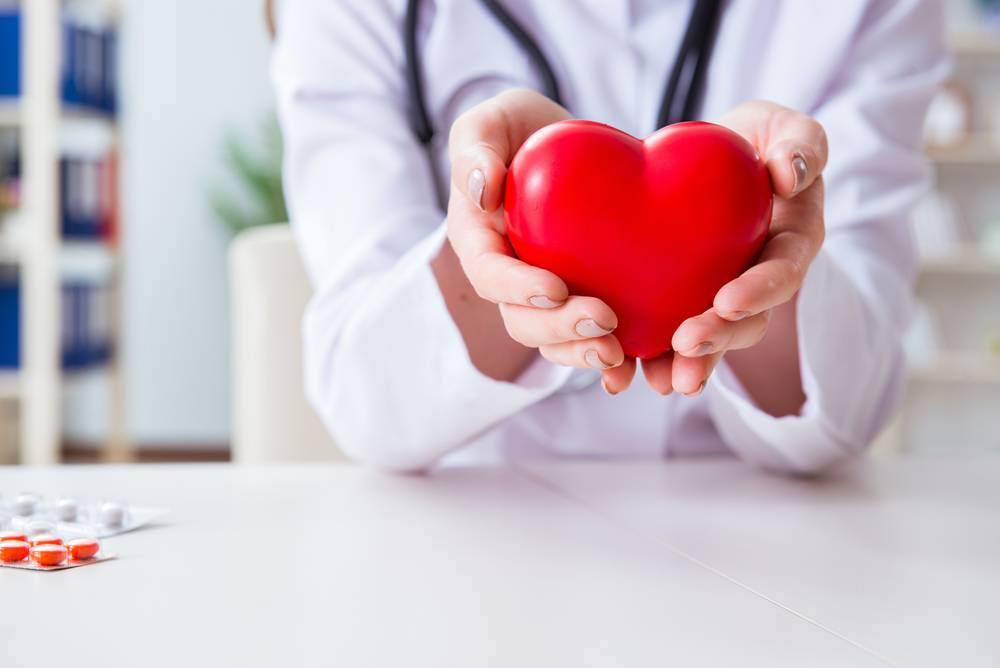

# BLUF
Overall, it shows that the slope of the peak exercise ST segment, asymptomatic chest pain, exercise induced angina, and sex of female have an effect on predicting Heart Disease with an accuracy of 95%. After running multiple different types of models, we discovered that the variable importance does depend on the model. However, old peak, sex of female, and exercise anigma were important in all of the models.

# Data Dictionary
# Heart Disease Dataset - Data Dictionary

The following table describes each attribute in the heart disease dataset. This dataset is used to predict the presence of heart disease in patients.

| S.No. | Attribute Code | Description | Data Type | Unit | Values |
|-------|----------------|-------------|-----------|------|--------|
| 1     | age            | Age of the patient | Numeric | Years | |
| 2     | sex            | Sex of the patient | Binary | | 1 = Male, 0 = Female |
| 3     | chest pain type | Type of chest pain experienced by the patient | Nominal | | 1: Typical angina, 2: Atypical angina, 3: Non-anginal pain, 4: Asymptomatic |
| 4     | resting bp s   | Resting blood pressure | Numeric | mm Hg | |
| 5     | cholesterol    | Serum cholesterol | Numeric | mg/dl | |
| 6     | fasting blood sugar | Fasting blood sugar > 120 mg/dl | Binary | | 1 = True, 0 = False |
| 7     | resting ecg    | Resting electrocardiographic results | Nominal | | 0: Normal, 1: ST-T wave abnormality, 2: Probable or definite left ventricular hypertrophy |
| 8     | max heart rate | Maximum heart rate achieved | Numeric | beats per minute | |
| 9     | exercise angina| Exercise induced angina | Binary | | 1 = Yes, 0 = No |
| 10    | oldpeak        | ST depression induced by exercise relative to rest | Numeric | | |
| 11    | ST slope       | The slope of the peak exercise ST segment | Nominal | | 1: Upsloping, 2: Flat, 3: Downsloping |
| 12    | target         | Presence of heart disease | Binary | | 1 = Presence, 0 = Absence |

### Additional Details:

- **Chest Pain Type**:
  - **1: Typical angina**: Chest pain related to heart
  - **2: Atypical angina**: Chest pain not related to heart
  - **3: Non-anginal pain**: Typically esophageal spasms (non heart related)
  - **4: Asymptomatic**: Chest pain not showing signs of disease

- **Resting ECG**:
  - **0: Normal**: Normal
  - **1: Having ST-T wave abnormality**: Can range from mild symptoms to severe problems
  - **2: Showing probable or definite left ventricular hypertrophy by Estes' criteria**






# Libraries

In [1]:
!pip install -q responsibleai
!pip install -q raiwidgets
!pip install -q shap
!pip install lime anchor-exp pdpbox

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 157.9/157.9 kB 2.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.5/2.5 MB 15.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.5/4.5 MB 23.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 9.9/9.9 MB 27.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 41.5/41.5 kB 1.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 130.7/130.7 kB 9.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 12.1/12.1 MB 32.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 51.9/51.9 kB 4.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 36.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 117.1/117.1 kB 7.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 116.3/116.3 kB 5.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 532.9/532.9 kB 21.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━

In [2]:
#import shap
import sklearn
import pandas as pd

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder, StandardScaler
from sklearn.metrics import mean_squared_error
from sklearn.metrics import mean_absolute_error, r2_score
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, confusion_matrix
from sklearn.model_selection import train_test_split
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler, OneHotEncoder

# Data

In [3]:
# DGdrive file: https://drive.google.com/file/d/1k6RWCnjSlvIx1cX_Yi0YfzEBEM16n6oB/view?usp=sharing

data = pd.read_csv('https://drive.google.com/uc?export=download&id=1k6RWCnjSlvIx1cX_Yi0YfzEBEM16n6oB')
data.head()

,age,sex,chest pain type,resting bp s,cholesterol,fasting blood sugar,resting ecg,max heart rate,exercise angina,oldpeak,ST slope,target
0,40,1,2,140,289,0,0,172,0,0.0,1,0
1,49,0,3,160,180,0,0,156,0,1.0,2,1
2,37,1,2,130,283,0,1,98,0,0.0,1,0
3,48,0,4,138,214,0,0,108,1,1.5,2,1
4,54,1,3,150,195,0,0,122,0,0.0,1,0


# Exploratory Data Analysis

In [4]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1190 entries, 0 to 1189
Data columns (total 12 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   age                  1190 non-null   int64  
 1   sex                  1190 non-null   int64  
 2   chest pain type      1190 non-null   int64  
 3   resting bp s         1190 non-null   int64  
 4   cholesterol          1190 non-null   int64  
 5   fasting blood sugar  1190 non-null   int64  
 6   resting ecg          1190 non-null   int64  
 7   max heart rate       1190 non-null   int64  
 8   exercise angina      1190 non-null   int64  
 9   oldpeak              1190 non-null   float64
 10  ST slope             1190 non-null   int64  
 11  target               1190 non-null   int64  
dtypes: float64(1), int64(11)
memory usage: 111.7 KB


In [5]:
data.describe()

,age,sex,chest pain type,resting bp s,cholesterol,fasting blood sugar,resting ecg,max heart rate,exercise angina,oldpeak,ST slope,target
count,1190.000000,1190.000000,1190.000000,1190.000000,1190.000000,1190.000000,1190.000000,1190.000000,1190.000000,1190.000000,1190.000000,1190.000000
mean,53.720168,0.763866,3.232773,132.153782,210.363866,0.213445,0.698319,139.732773,0.387395,0.922773,1.624370,0.528571
std,9.358203,0.424884,0.935480,18.368823,101.420489,0.409912,0.870359,25.517636,0.487360,1.086337,0.610459,0.499393
min,28.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,60.000000,0.000000,-2.600000,0.000000,0.000000
25%,47.000000,1.000000,3.000000,120.000000,188.000000,0.000000,0.000000,121.000000,0.000000,0.000000,1.000000,0.000000
50%,54.000000,1.000000,4.000000,130.000000,229.000000,0.000000,0.000000,140.500000,0.000000,0.600000,2.000000,1.000000
75%,60.000000,1.000000,4.000000,140.000000,269.750000,0.000000,2.000000,160.000000,1.000000,1.600000,2.000000,1.000000
max,77.000000,1.000000,4.000000,200.000000,603.000000,1.000000,2.000000,202.000000,1.000000,6.200000,3.000000,1.000000


In [6]:
data.isnull().sum()

age                    0
sex                    0
chest pain type        0
resting bp s           0
cholesterol            0
fasting blood sugar    0
resting ecg            0
max heart rate         0
exercise angina        0
oldpeak                0
ST slope               0
target                 0
dtype: int64

In [7]:
data.shape

(1190, 12)

# Data Preprocessing

In [8]:
# One-hot encode nominal attributes
data = pd.get_dummies(data, columns=['chest pain type', 'resting ecg', 'ST slope'], drop_first=True,dtype = int)

if 'ST slope_3' in data.columns:
    data.drop('ST slope_3', axis=1, inplace=True)

# Scale numeric features
scaler = StandardScaler()
numerical_features = ['age', 'resting bp s', 'cholesterol', 'max heart rate', 'oldpeak']
data[numerical_features] = scaler.fit_transform(data[numerical_features])

data.head()

,age,sex,resting bp s,cholesterol,fasting blood sugar,max heart rate,exercise angina,oldpeak,target,chest pain type_2,chest pain type_3,chest pain type_4,resting ecg_1,resting ecg_2,ST slope_1,ST slope_2
0,-1.466728,1,0.427328,0.775674,0,1.265039,0,-0.849792,0,1,0,0,0,0,1,0
1,-0.504600,0,1.516587,-0.299512,0,0.637758,0,0.071119,1,0,1,0,0,0,0,1
2,-1.787437,1,-0.117301,0.716489,0,-1.636136,0,-0.849792,0,1,0,0,1,0,1,0
3,-0.611503,0,0.318402,0.035867,0,-1.244085,1,0.531575,1,0,0,1,0,0,0,1
4,0.029915,1,0.971958,-0.151550,0,-0.695214,0,-0.849792,0,0,1,0,0,0,1,0


# Splitting Data

In [9]:
# Features and target variable
X = data.drop('target', axis=1)
y = data['target']

# Splitting the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.20, random_state=42)

# Check the size of the splits
X_train.shape, X_test.shape, y_train.shape, y_test.shape

((952, 15), (238, 15), (952,), (238,))

# Building Random Forest Classifier

In [10]:
# Initialize the Random Forest Classifier
model = RandomForestClassifier(n_estimators=100, random_state=42)

# Train the model on the training data
model.fit(X_train, y_train)

# Predict on the test data
y_pred = model.predict(X_test)

accuracy = accuracy_score(y_test, y_pred)
print(f'Accuracy: {accuracy}')
cm = confusion_matrix(y_test, y_pred)
print('Confusion Matrix\n', cm)

Accuracy: 0.9495798319327731
Confusion Matrix
 [[ 99   8]
 [  4 127]]


# Generate Data Insights

In [11]:
pip install --upgrade statsmodels

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 10.8/10.8 MB 19.2 MB/s eta 0:00:00
  Attempting uninstall: statsmodels
    Found existing installation: statsmodels 0.13.5
    Uninstalling statsmodels-0.13.5:
      Successfully uninstalled statsmodels-0.13.5
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
responsibleai 0.35.0 requires statsmodels<0.14.0, but you have statsmodels 0.14.2 which is incompatible.


In [12]:
from typing import Literal
from raiwidgets import ResponsibleAIDashboard, ErrorAnalysisDashboard
from responsibleai import RAIInsights
from responsibleai.feature_metadata import FeatureMetadata

In [13]:
# Creating the feature metadata
feature_metadata = FeatureMetadata(
    categorical_features=[
        'sex','exercise angina',  # Original binary features
        'chest pain type_4',  # Encoded chest pain type
        'ST slope_1', 'ST slope_2',  # Encoded ST slope
        'fasting blood sugar', 'chest pain type_2', 'chest pain type_3','resting ecg_1', 'resting ecg_2'
    ],
    dropped_features=[]  # Update if any features were dropped during preprocessing
)

In [14]:
# Reinclude the 'target' column in the train and test sets for RAIInsights
train_with_target = X_train.copy()
train_with_target['target'] = y_train

test_with_target = X_test.copy()
test_with_target['target'] = y_test

# Now create RAIInsights with the adjusted datasets
rai_insights = RAIInsights(model, train_with_target, test_with_target, 'target', 'classification', feature_metadata=feature_metadata)

In [15]:
# Interpretability
rai_insights.explainer.add()
rai_insights.counterfactual.add(total_CFs=5, desired_class='opposite',feature_importance = False) #set as 0 or 1

ErrorAnalysis started at http://localhost:8704



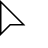
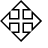
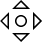
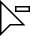
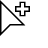

In [16]:
ErrorAnalysisDashboard(dataset=X_test, true_y=y_test, features=['age', 'sex', 'resting bp s', 'cholesterol', 'fasting blood sugar',
       'max heart rate', 'exercise angina', 'oldpeak', 'chest pain type_2',
       'chest pain type_3', 'chest pain type_4', 'resting ecg_1',
       'resting ecg_2', 'ST slope_1', 'ST slope_2'], pred_y=y_pred, model_task='classification', max_depth=3)

In [17]:
rai_insights.compute()

Causal Effects
Current Status: Generating Causal Effects.
Current Status: Finished generating causal effects.
Time taken: 0.0 min 5.890299996735848e-05 sec
Counterfactual
Current Status: Generating 5 counterfactuals for 238 samples


100%|██████████| 238/238 [21:19<00:00,  5.38s/it]


Current Status: Generated 5 counterfactuals for 238 samples.
Time taken: 21.0 min 20.236128465000093 sec
Error Analysis
Current Status: Generating error analysis reports.
Current Status: Finished generating error analysis reports.
Time taken: 0.0 min 0.0023471349998089863 sec
Explanations
Current Status: Explaining 15 features
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000131 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 410
[LightGBM] [Info] Number of data points in the train set: 952, number of used features: 15
[LightGBM] [Info] Start training from score 0.089733


categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.


Current Status: Explained 15 features.
Time taken: 0.0 min 1.280859904999943 sec


In [18]:
ResponsibleAIDashboard(rai_insights)

ResponsibleAI started at http://localhost:8705


In [19]:
#Click on the link in the output to interact with the dashboard
from google.colab.output import eval_js

print(eval_js("google.colab.kernel.proxyPort(8705)")) # Modify your port here

https://ld5pfbdbgb8-496ff2e9c6d22116-8705-colab.googleusercontent.com/


# LIME and PDPs

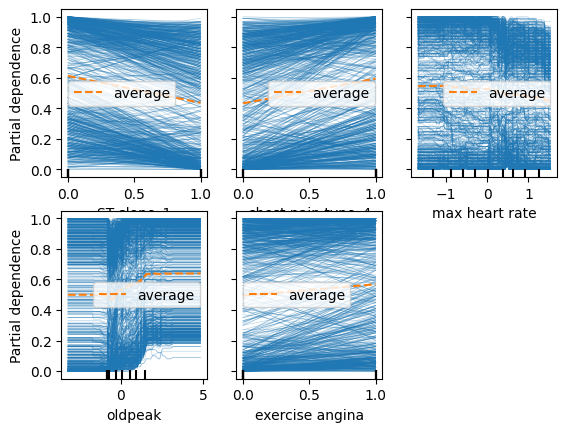

In [25]:
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from lime.lime_tabular import LimeTabularExplainer
import matplotlib.pyplot as plt
from sklearn.inspection import PartialDependenceDisplay
from anchor import anchor_tabular
from pdpbox import pdp, info_plots

# # Load your dataset
# heart_data = data

# # One-hot encode nominal attributes
# heart_data = pd.get_dummies(heart_data, columns=['chest pain type', 'resting ecg', 'ST slope'], drop_first=True,dtype = int)

# # Scale numeric features
# scaler = StandardScaler()
# numerical_features = ['age', 'resting bp s', 'cholesterol', 'max heart rate', 'oldpeak']
# heart_data[numerical_features] = scaler.fit_transform(heart_data[numerical_features])

# # Split the data into train and test sets
# X = heart_data.drop('target', axis=1)
# y = heart_data['target']
# X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Train a classifier (Random Forest Classifier)
model = RandomForestClassifier(random_state=42)
model.fit(X_train, y_train)

# LIME for Classification
explainer = LimeTabularExplainer(X_train.to_numpy(),
                                 feature_names=X_train.columns.tolist(),
                                 class_names=['No Heart Disease', 'Heart Disease'],
                                 mode='classification')

idx = 0  # index of the instance you want to explain
exp = explainer.explain_instance(X_test.iloc[idx].to_numpy(), model.predict_proba, num_features=5)
exp.show_in_notebook(show_table=True)

# Partial Dependence Plot (PDP)
# Choose a relevant feature

features = ['ST slope_1', 'chest pain type_4', 'max heart rate', 'oldpeak', 'exercise angina']  # Example features to analyze
PartialDependenceDisplay.from_estimator(model, X, features=features, kind="both")
plt.show()

# h2o-3 XAI Toolkit

In [21]:
!pip install h2o --upgrade

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 265.6/265.6 MB 5.3 MB/s eta 0:00:00


3.46.0.1
Checking whether there is an H2O instance running at http://localhost:54321..... not found.
Attempting to start a local H2O server...
  Java Version: openjdk version "11.0.22" 2024-01-16; OpenJDK Runtime Environment (build 11.0.22+7-post-Ubuntu-0ubuntu222.04.1); OpenJDK 64-Bit Server VM (build 11.0.22+7-post-Ubuntu-0ubuntu222.04.1, mixed mode, sharing)
  Starting server from /usr/local/lib/python3.10/dist-packages/h2o/backend/bin/h2o.jar
  Ice root: /tmp/tmpysxfalnt
  JVM stdout: /tmp/tmpysxfalnt/h2o_unknownUser_started_from_python.out
  JVM stderr: /tmp/tmpysxfalnt/h2o_unknownUser_started_from_python.err
  Server is running at http://127.0.0.1:54321
Connecting to H2O server at http://127.0.0.1:54321 ... successful.


H2O_cluster_uptime:,05 secs
H2O_cluster_timezone:,Etc/UTC
H2O_data_parsing_timezone:,UTC
H2O_cluster_version:,3.46.0.1
H2O_cluster_version_age:,1 month and 12 days
H2O_cluster_name:,H2O_from_python_unknownUser_dw8vu7
H2O_cluster_total_nodes:,1
H2O_cluster_free_memory:,3.170 Gb
H2O_cluster_total_cores:,2
H2O_cluster_allowed_cores:,2
H2O_cluster_status:,"locked, healthy"


Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%
drf Model Build progress: |██████████████████████████████████████████████████████| (done) 100%


# Residual Analysis

> Residual Analysis plots the fitted values vs residuals on a test dataset. Ideally, residuals should be randomly distributed. Patterns in this plot can indicate potential problems with the model selection, e.g., using simpler model than necessary, not accounting for heteroscedasticity, autocorrelation, etc. Note that if you see "striped" lines of residuals, that is an artifact of having an integer valued (vs a real valued) response variable.

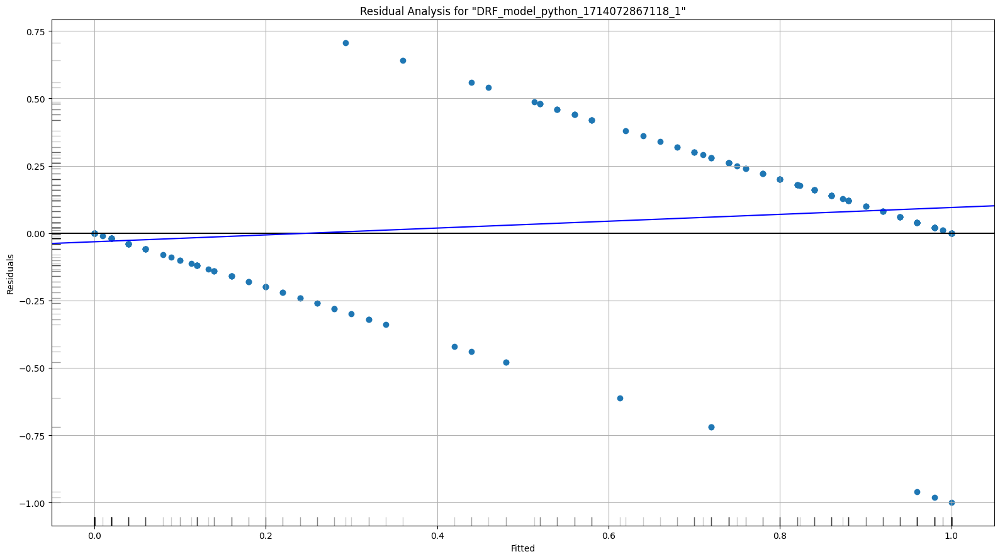

# Learning Curve Plot

> Learning curve plot shows the loss function/metric dependent on number of iterations or trees for tree-based algorithms. This plot can be useful for determining whether the model overfits.

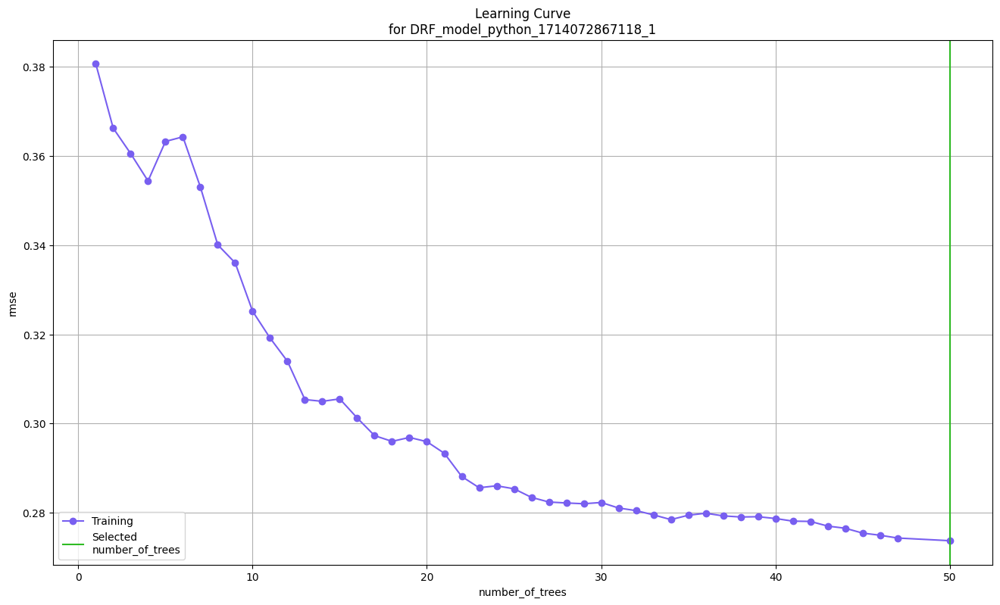

# Variable Importance

> The variable importance plot shows the relative importance of the most important variables in the model.

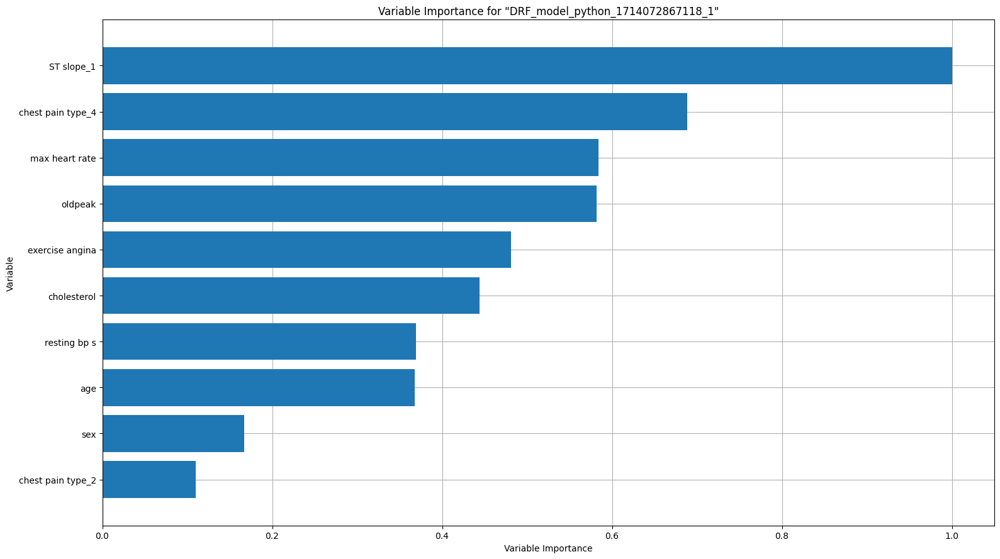

# SHAP Summary

> SHAP summary plot shows the contribution of the features for each instance (row of data). The sum of the feature contributions and the bias term is equal to the raw prediction of the model, i.e., prediction before applying inverse link function.

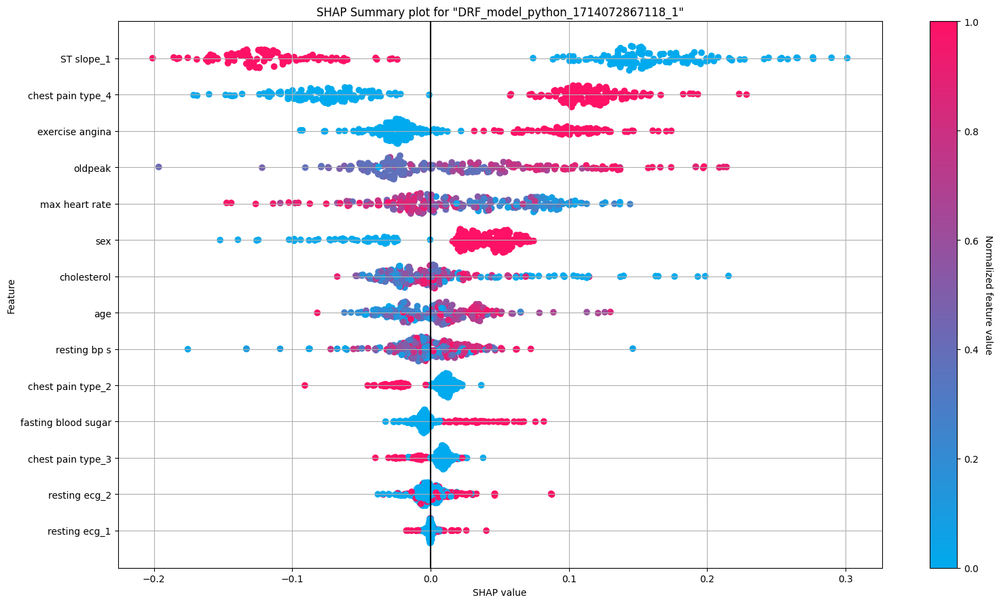

# Partial Dependence Plots

> Partial dependence plot (PDP) gives a graphical depiction of the marginal effect of a variable on the response. The effect of a variable is measured in change in the mean response. PDP assumes independence between the feature for which is the PDP computed and the rest.

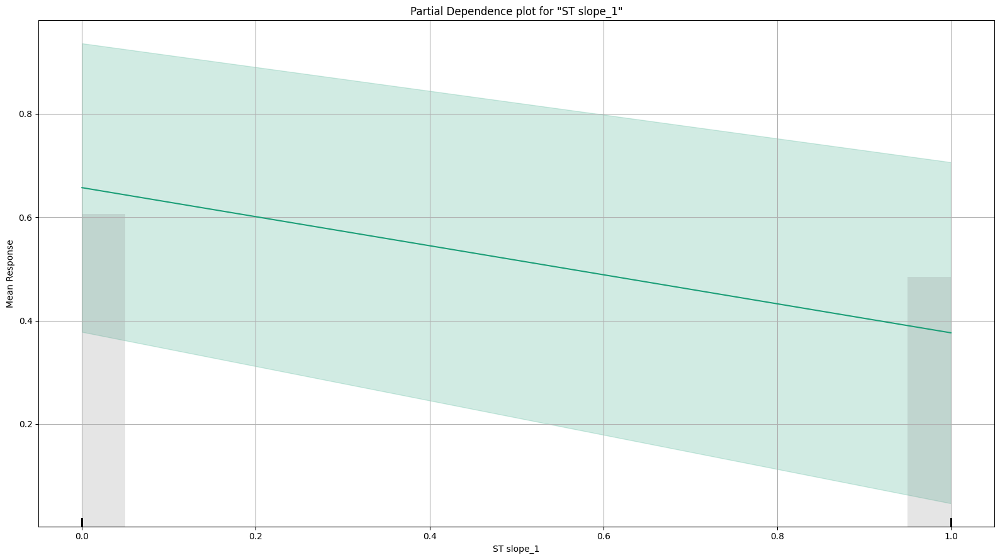

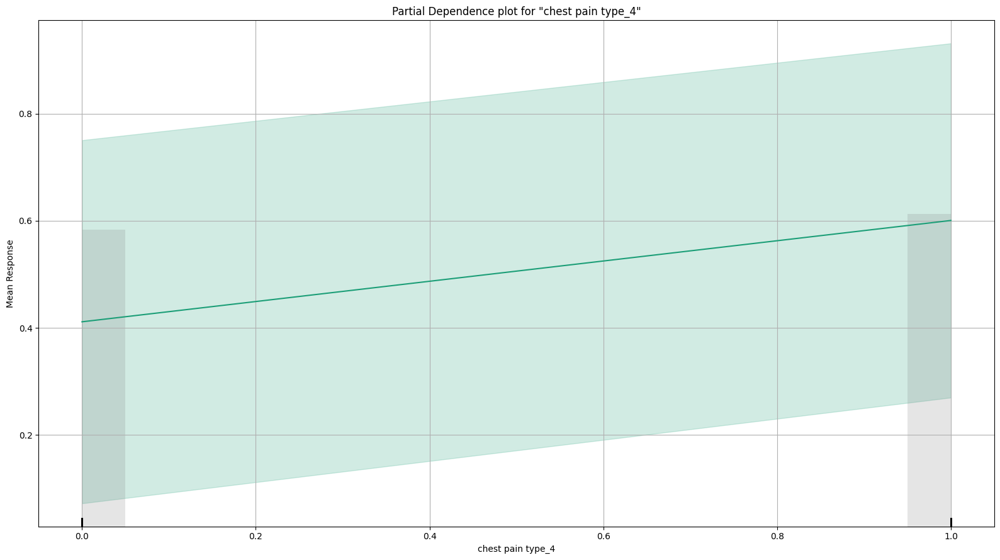

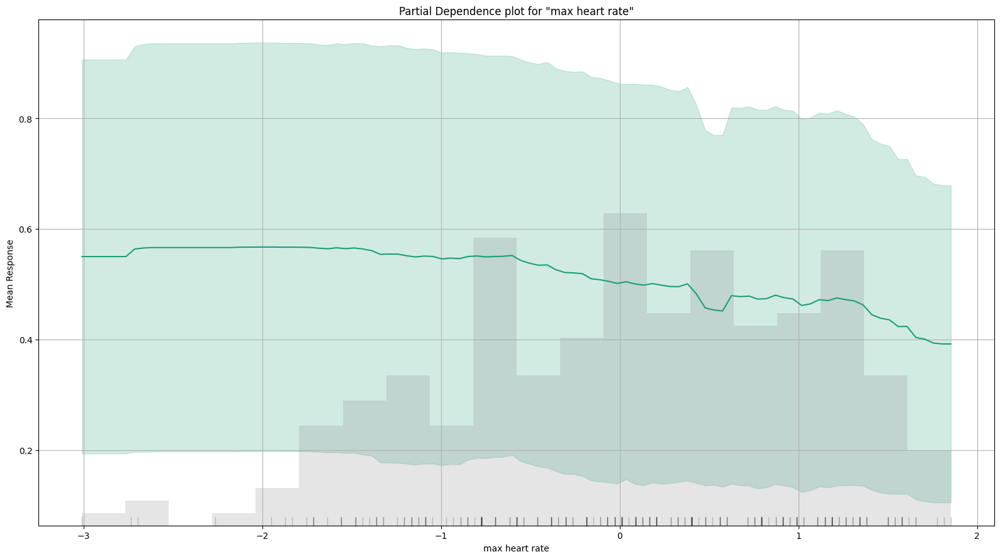

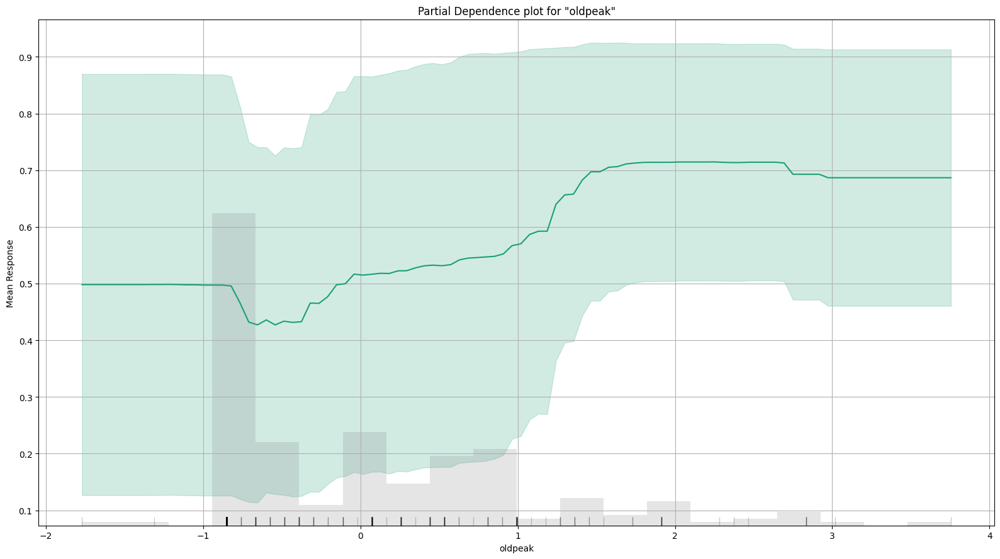

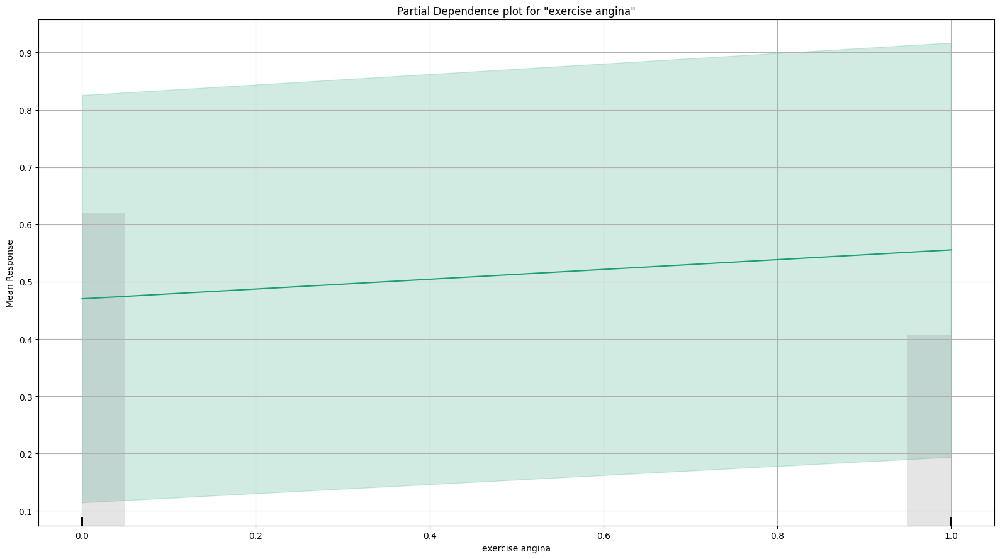

# Individual Conditional Expectation

> An Individual Conditional Expectation (ICE) plot gives a graphical depiction of the marginal effect of a variable on the response. ICE plots are similar to partial dependence plots (PDP); PDP shows the average effect of a feature while ICE plot shows the effect for a single instance. This function will plot the effect for each decile. In contrast to the PDP, ICE plots can provide more insight, especially when there is stronger feature interaction.

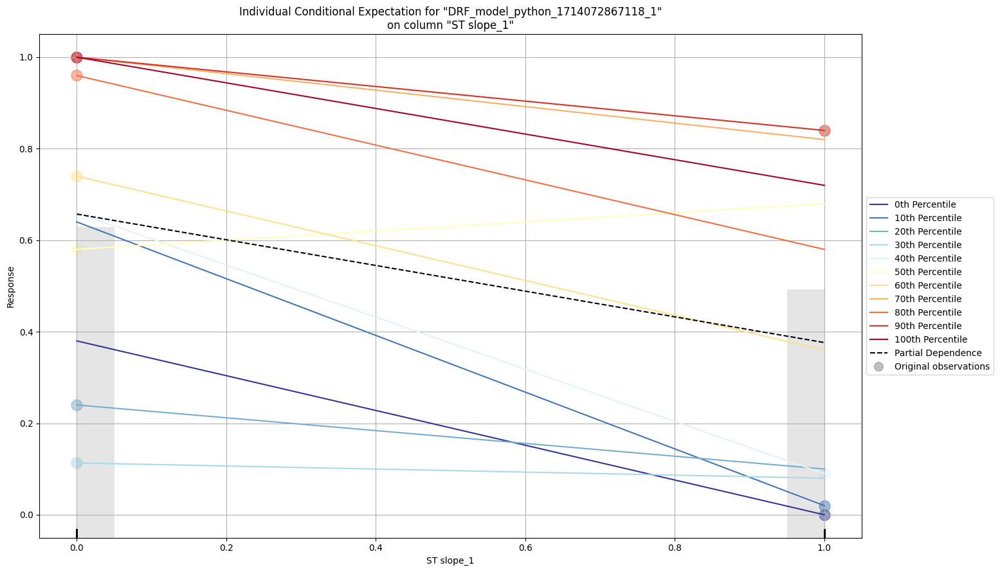

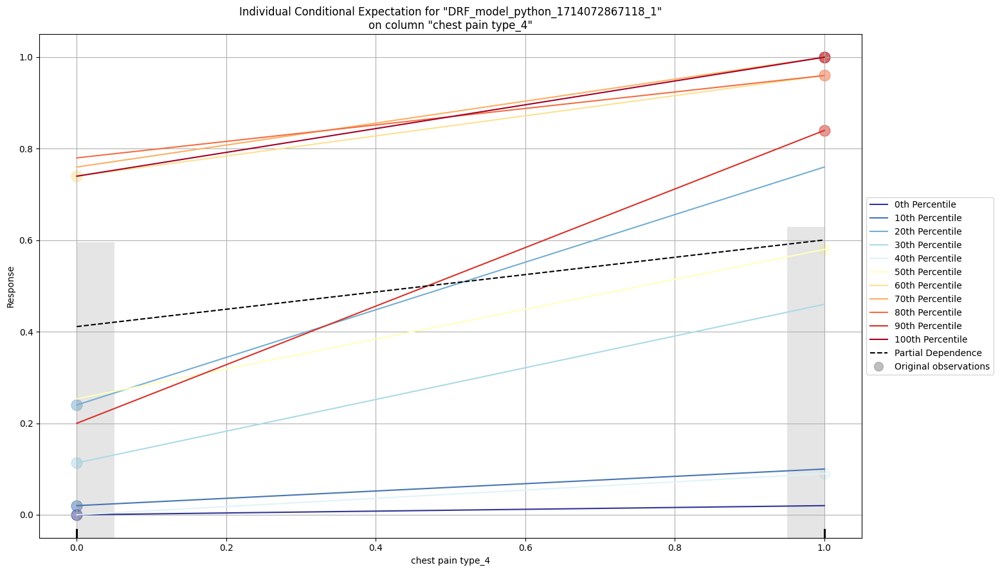

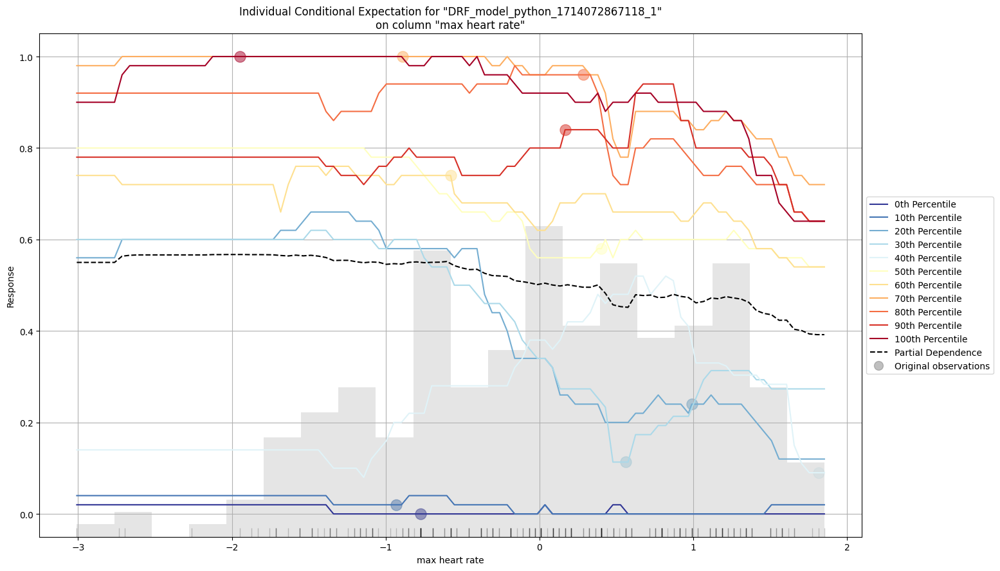

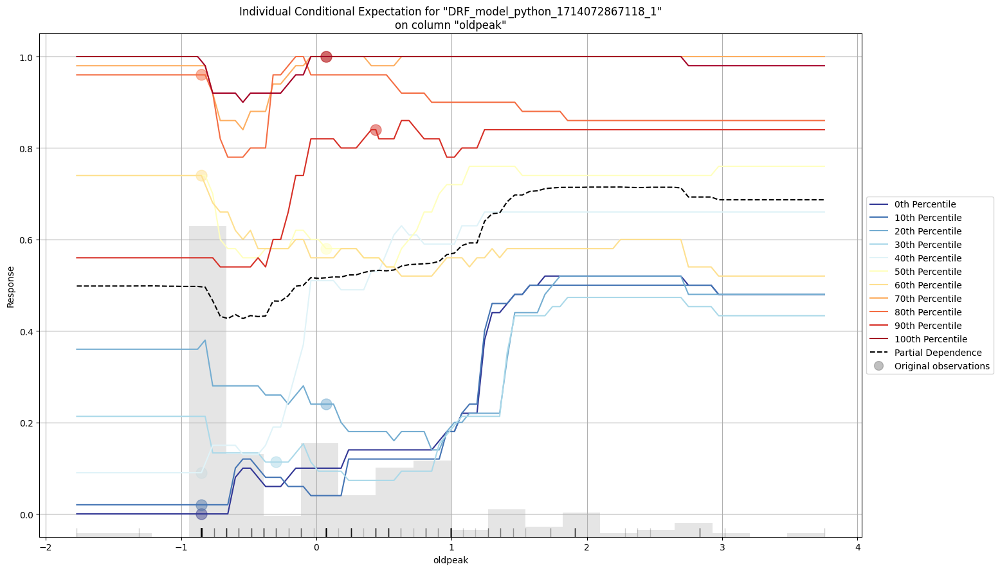

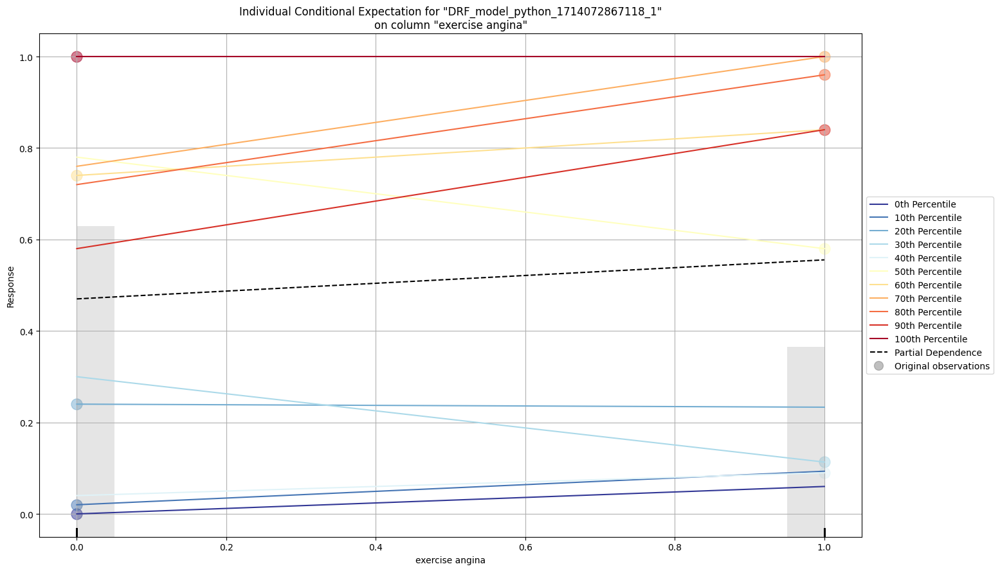

# Residual Analysis

> Residual Analysis plots the fitted values vs residuals on a test dataset. Ideally, residuals should be randomly distributed. Patterns in this plot can indicate potential problems with the model selection, e.g., using simpler model than necessary, not accounting for heteroscedasticity, autocorrelation, etc. Note that if you see "striped" lines of residuals, that is an artifact of having an integer valued (vs a real valued) response variable.

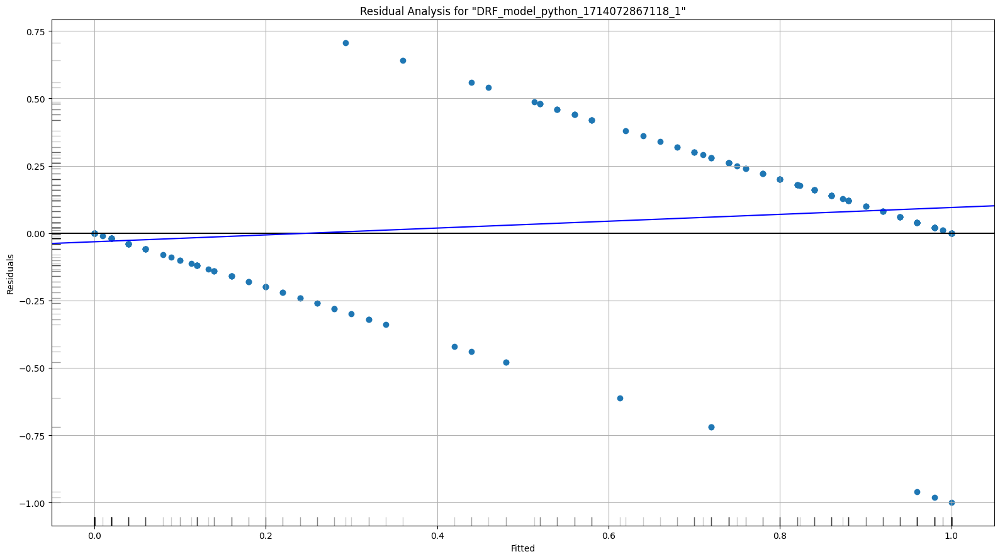

# Learning Curve Plot

> Learning curve plot shows the loss function/metric dependent on number of iterations or trees for tree-based algorithms. This plot can be useful for determining whether the model overfits.

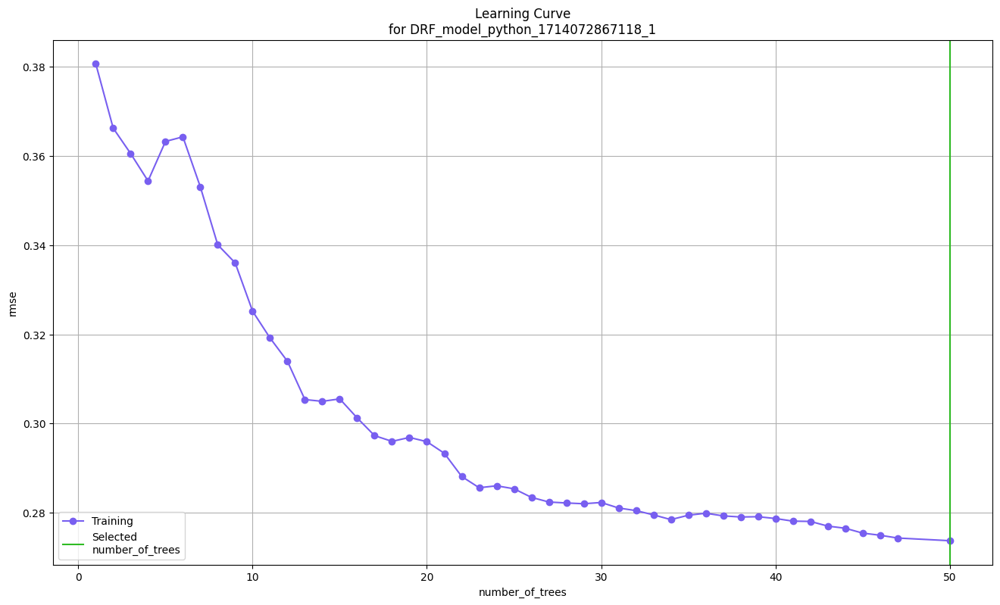

# Variable Importance

> The variable importance plot shows the relative importance of the most important variables in the model.

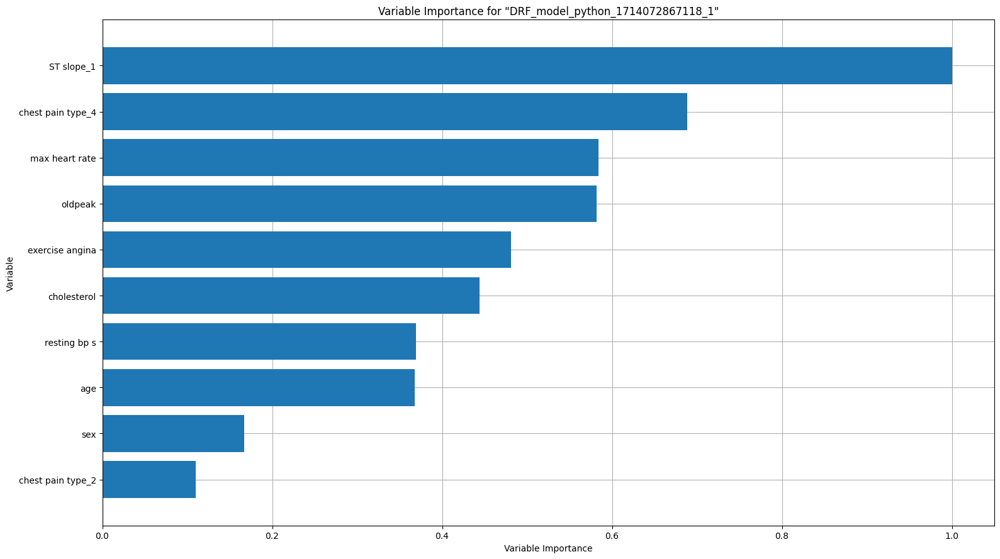

# SHAP Summary

> SHAP summary plot shows the contribution of the features for each instance (row of data). The sum of the feature contributions and the bias term is equal to the raw prediction of the model, i.e., prediction before applying inverse link function.

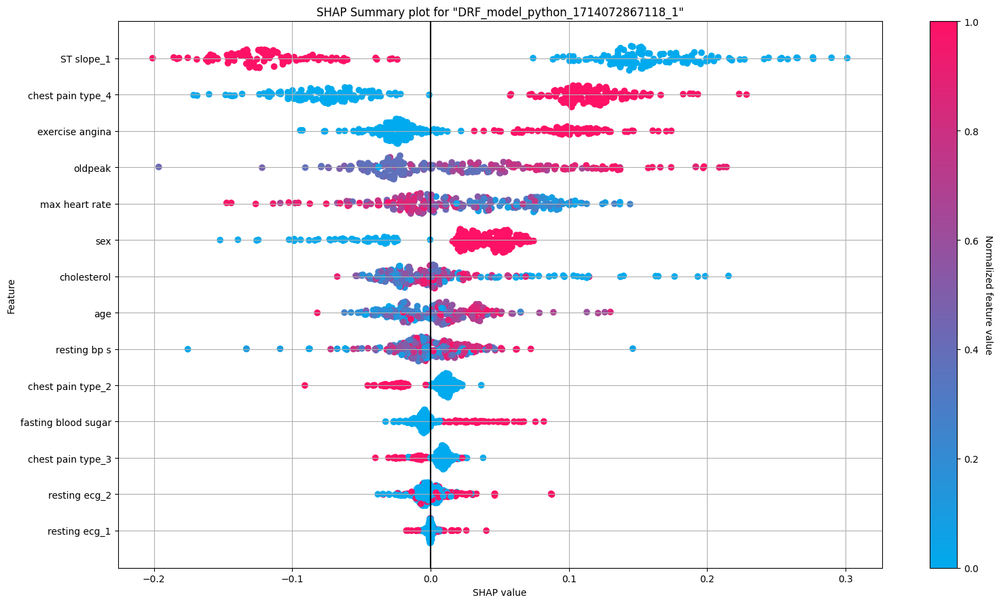

# Partial Dependence Plots

> Partial dependence plot (PDP) gives a graphical depiction of the marginal effect of a variable on the response. The effect of a variable is measured in change in the mean response. PDP assumes independence between the feature for which is the PDP computed and the rest.

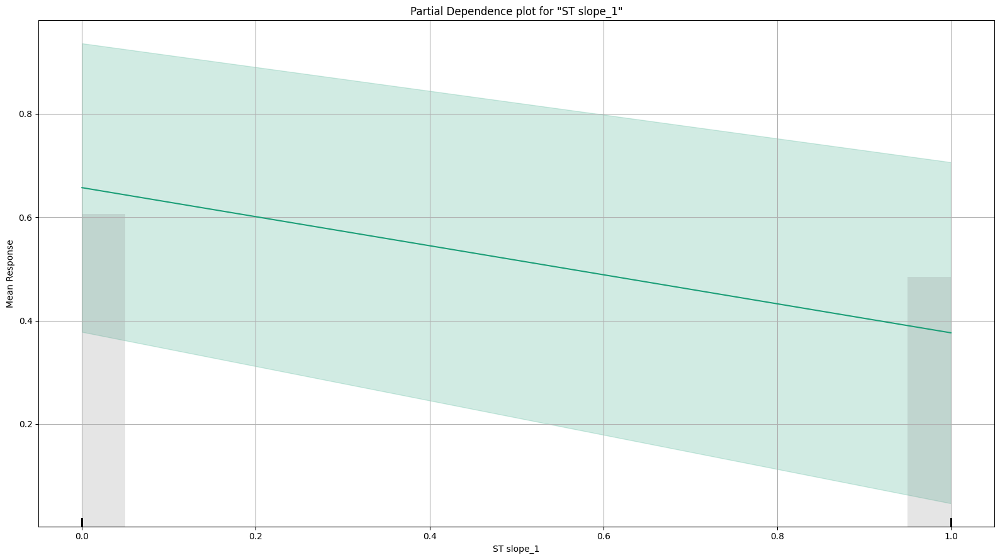

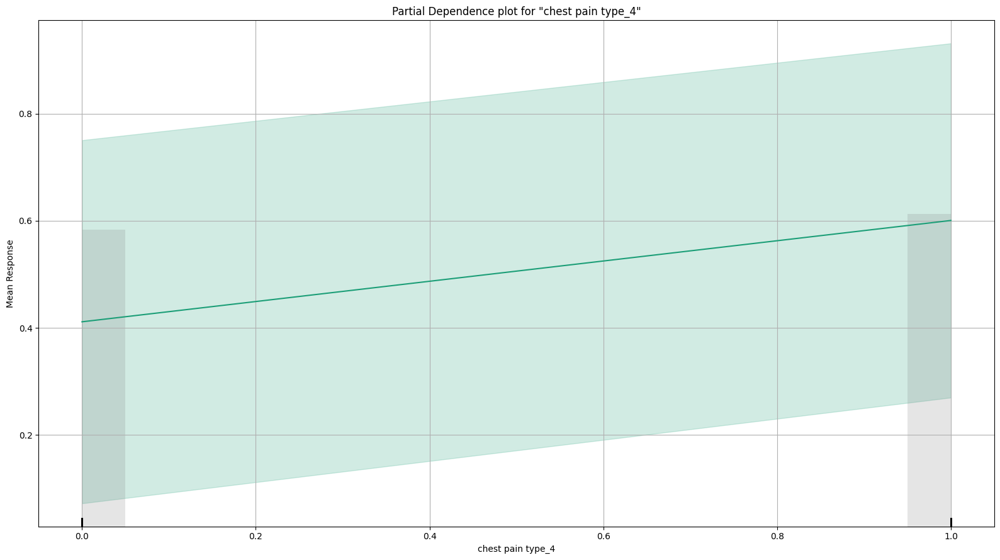

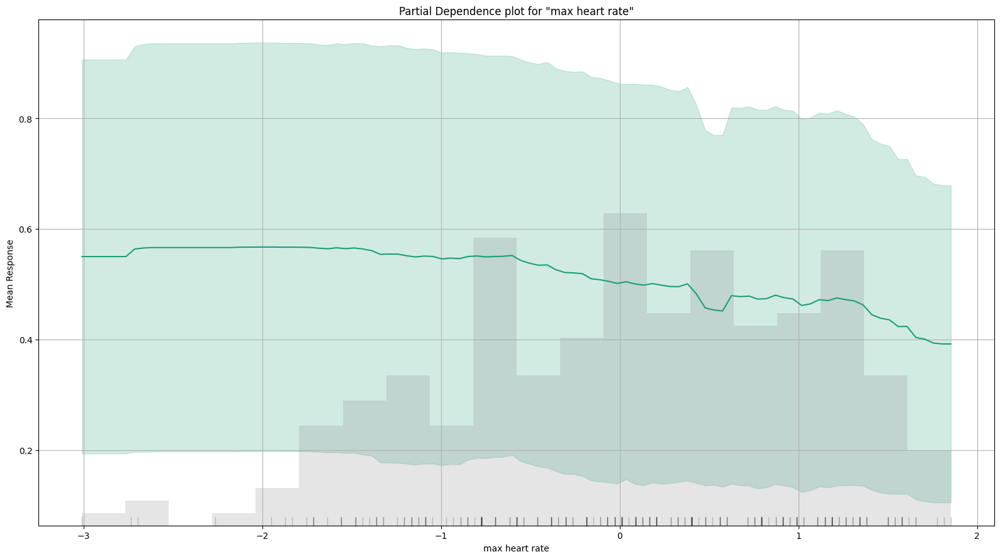

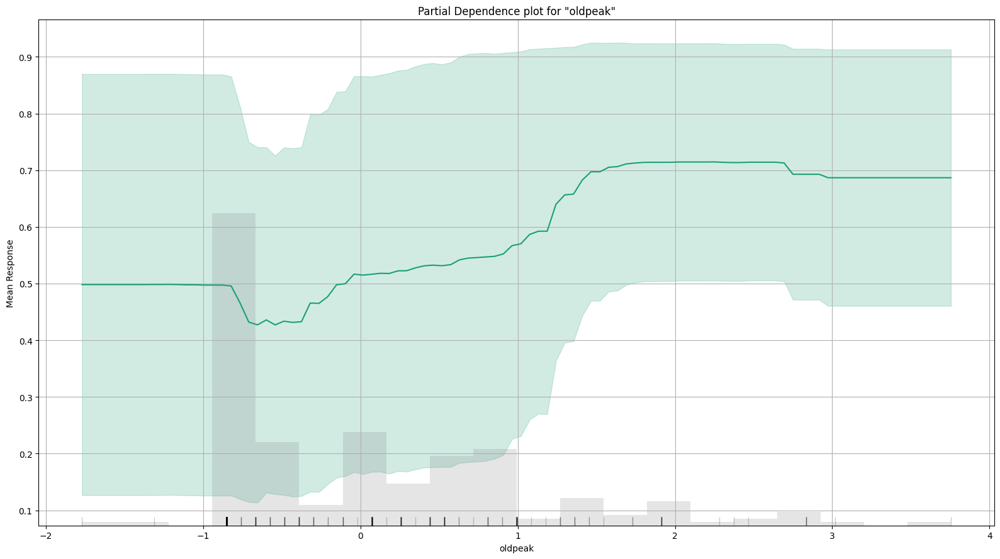

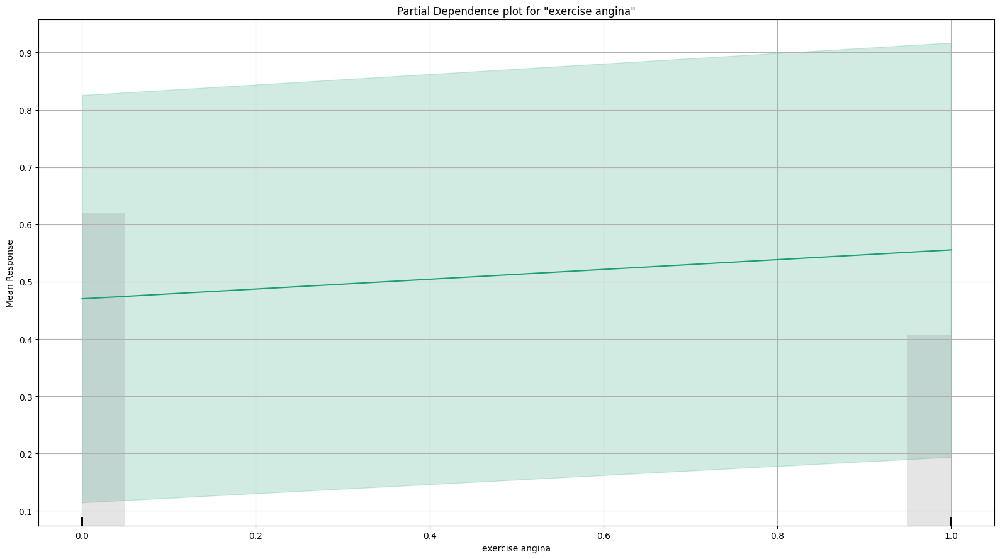

# Individual Conditional Expectation

> An Individual Conditional Expectation (ICE) plot gives a graphical depiction of the marginal effect of a variable on the response. ICE plots are similar to partial dependence plots (PDP); PDP shows the average effect of a feature while ICE plot shows the effect for a single instance. This function will plot the effect for each decile. In contrast to the PDP, ICE plots can provide more insight, especially when there is stronger feature interaction.

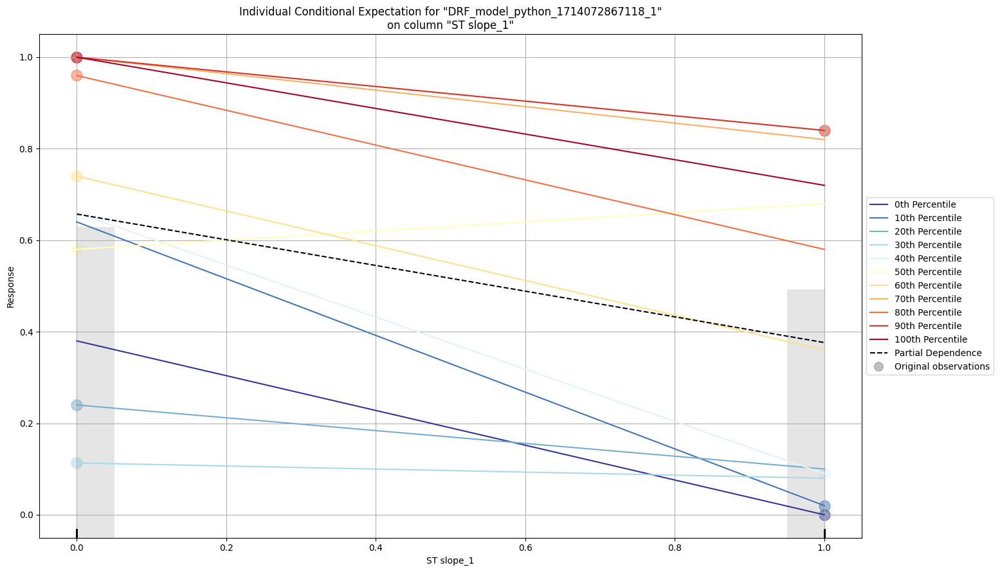

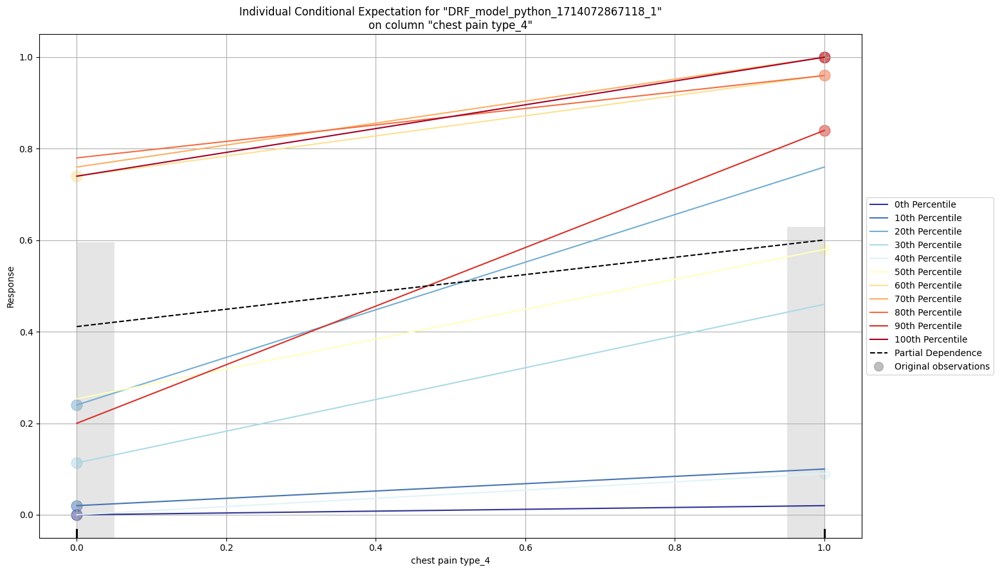

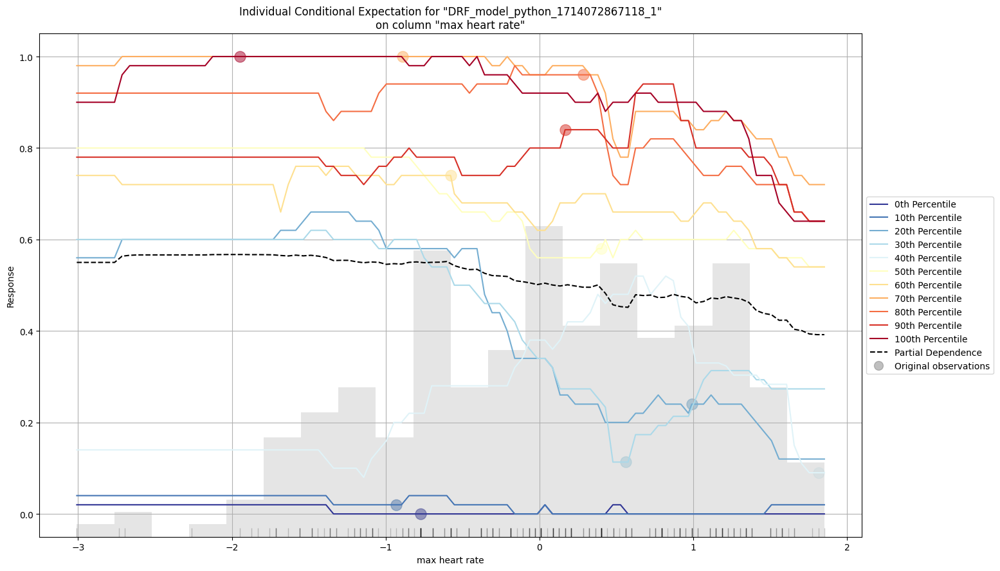

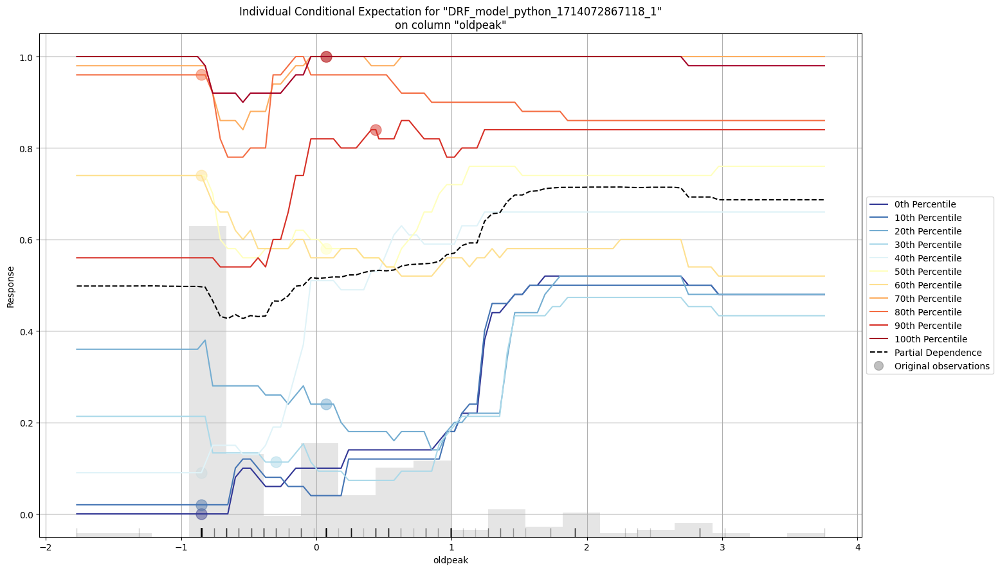

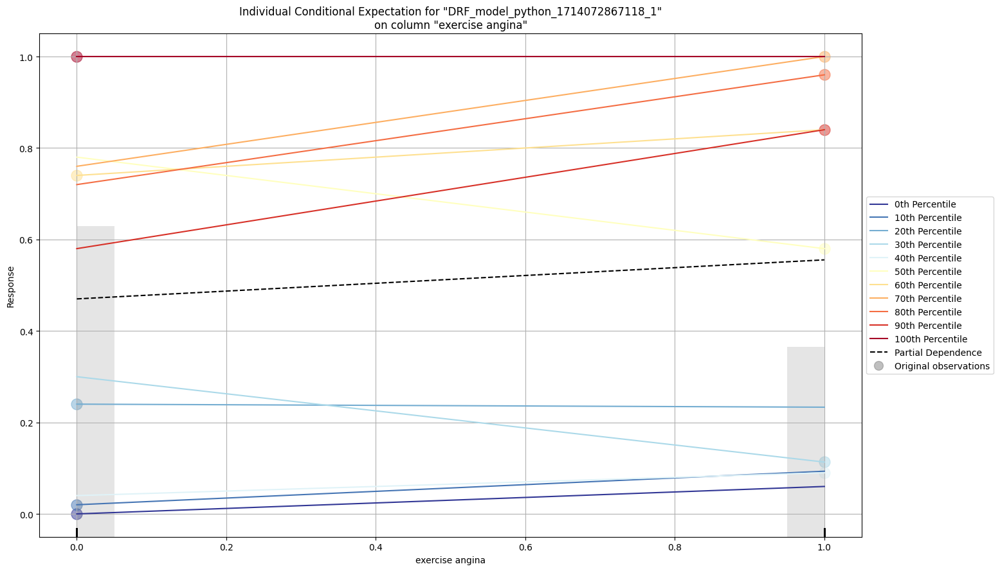

In [22]:
import h2o
print(h2o.__version__)
from h2o.estimators import H2ORandomForestEstimator
import pandas as pd

# Start H2O
h2o.init()

# Convert to H2O Frame
feature_names = data.columns
hf = h2o.H2OFrame(data)

# Specify the features and target, and split the data
feature_cols = hf.columns[:-1]
target_col = 'target'
train, test = hf.split_frame(ratios=[.8], seed=1234)

# Initialize and train the random forest model
model = H2ORandomForestEstimator(ntrees=50, max_depth=20, seed=42)
model.train(x=feature_cols, y=target_col, training_frame=train)

# Explain the model
model.explain(test)

# Surrogate Model

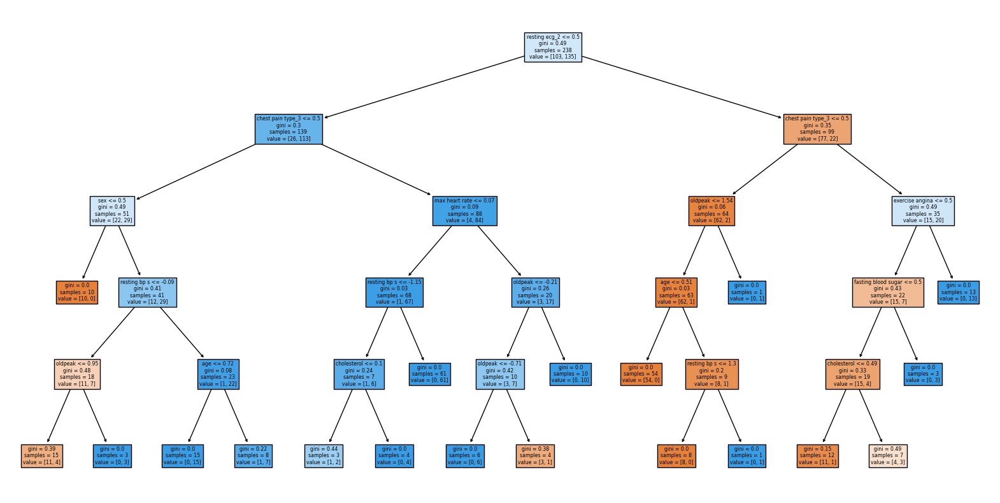

|--- Feature 13 <= 0.50
|   |--- Feature 10 <= 0.50
|   |   |--- Feature 1 <= 0.50
|   |   |   |--- class: 0
|   |   |--- Feature 1 >  0.50
|   |   |   |--- Feature 2 <= -0.09
|   |   |   |   |--- Feature 7 <= 0.95
|   |   |   |   |   |--- class: 0
|   |   |   |   |--- Feature 7 >  0.95
|   |   |   |   |   |--- class: 1
|   |   |   |--- Feature 2 >  -0.09
|   |   |   |   |--- Feature 0 <= 0.72
|   |   |   |   |   |--- class: 1
|   |   |   |   |--- Feature 0 >  0.72
|   |   |   |   |   |--- class: 1
|   |--- Feature 10 >  0.50
|   |   |--- Feature 5 <= 0.07
|   |   |   |--- Feature 2 <= -1.15
|   |   |   |   |--- Feature 3 <= 0.10
|   |   |   |   |   |--- class: 1
|   |   |   |   |--- Feature 3 >  0.10
|   |   |   |   |   |--- class: 1
|   |   |   |--- Feature 2 >  -1.15
|   |   |   |   |--- class: 1
|   |   |--- Feature 5 >  0.07
|   |   |   |--- Feature 7 <= -0.21
|   |   |   |   |--- Feature 7 <= -0.71
|   |   |   |   |   |--- class: 1
|   |   |   |   |--- Feature 7 >  -0.71
|   |   

In [26]:
import numpy as np
from sklearn.tree import DecisionTreeClassifier, export_text, plot_tree
import matplotlib.pyplot as plt

feature_names=data.columns
# Train the surrogate model
surrogate_model = DecisionTreeClassifier(max_depth=5)  # Limit depth for simplicity and interpretability
surrogate_model.fit(X_test, y_pred)

# Visualize the surrogate model
plt.figure(figsize=(20,10))
plot_tree(surrogate_model, filled=True, feature_names=feature_names, proportion=False, precision=2)
plt.show()

# Optionally, display the decision rules as text
print(export_text(surrogate_model, feature_names=[f'Feature {i}' for i in range(X_test.shape[1])]))


# Conclusions

The top 5 most important variables is ST slope of 1 which has a level of 1.0, chest pain type 4, which has a level of 0.7, old peak which has a level of 0.5, and exercise angina which has a level of 0.5. After doing additional analyses, we discovered that sex is also an important variable in predicting Heart Disease with the slope being 0.5. Along with that, we discovered that max heart rate does have some effect on predicting heart disease when we use a different model.

When comparing among different models, we found that sex, exercise anigma, and old peak were common for all models, which emphasizes the importance that these variables have on predicting heart disease.

ST Slope of 1 is a negative variable importance, chest pain type 4 is a positive variable importance, max heart rate is a negative relationship, old peak has a positive relationship and exercise angina has a positive relationship.

The overall model has an accuracy of 95% which means that the model is predicting heart disease accuractly of 95%. The false positive rate of the model is roughly 7% and the false negative rate is 3%.

Overall, it shows that the slope of the peak exercise ST segment, asymptomatic chest pain, exercise induced angina, and sex of female have an effect on predicting Heart Disease with an accuracy of 95%.